
# Objective

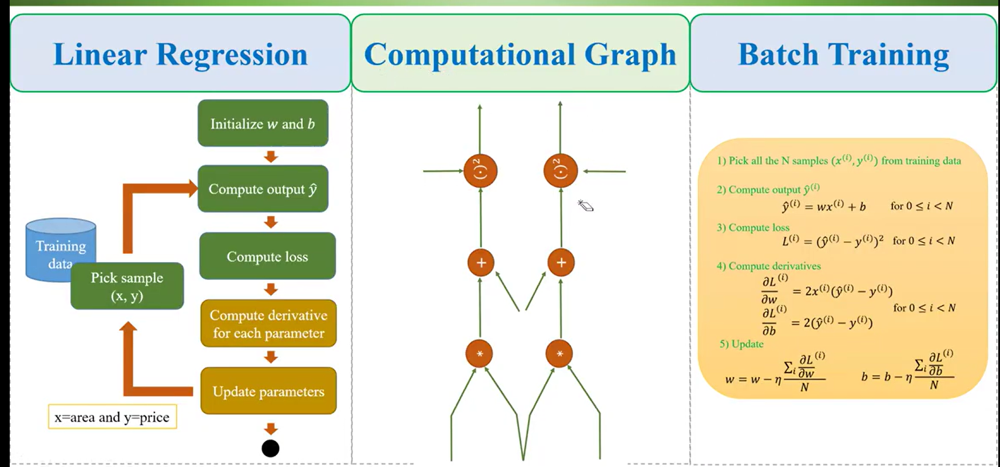

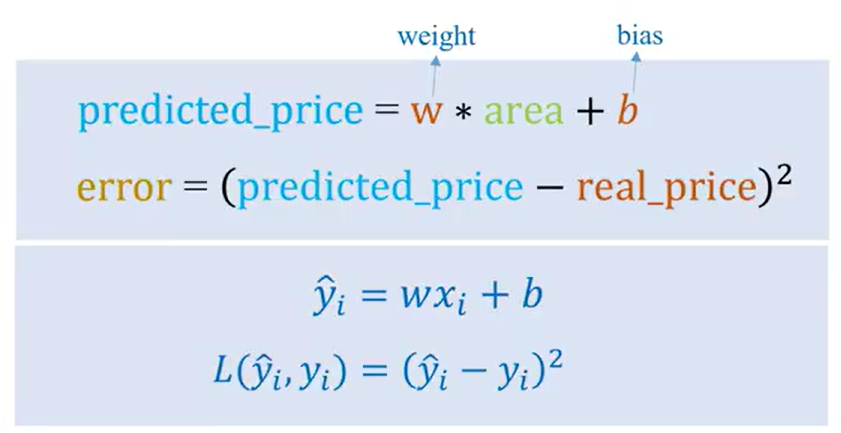

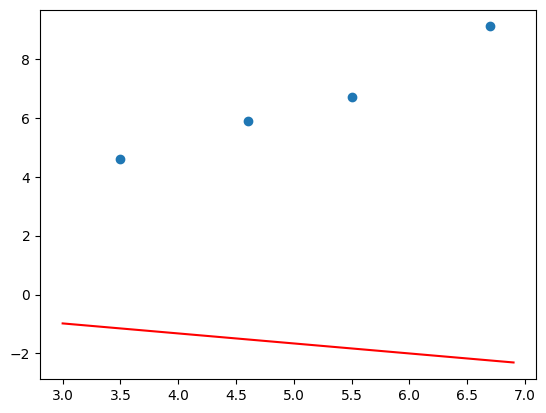

In [423]:
import matplotlib.pyplot as plt
import numpy as np

area = np.array([6.7, 4.6, 3.5, 5.5])
prices = np.array([9.1, 5.9, 4.6, 6.7])
#ex: w = -0.34, b =0.04
w = -0.34
b = 0.04
x_values = np.arange(3, 7, 0.1)
y_values = x_values*w +b

plt.scatter(area, prices) 
plt.plot(x_values, y_values, color = 'r')

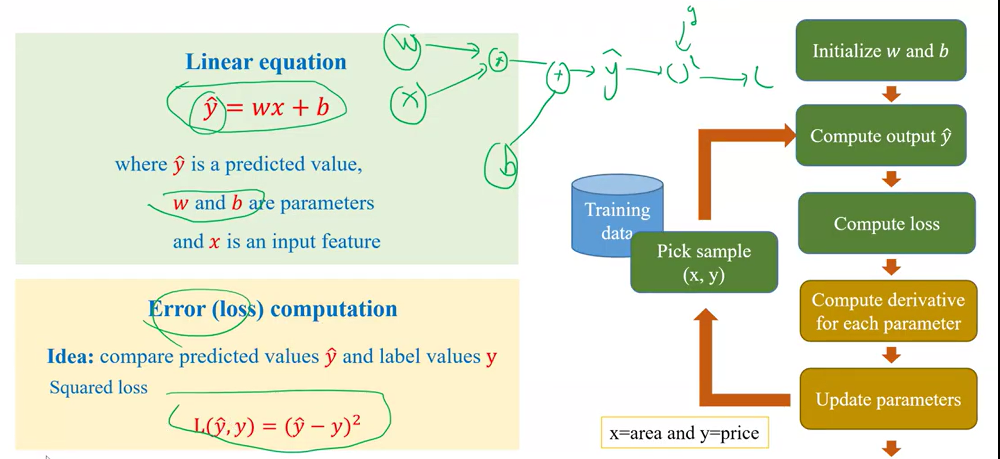

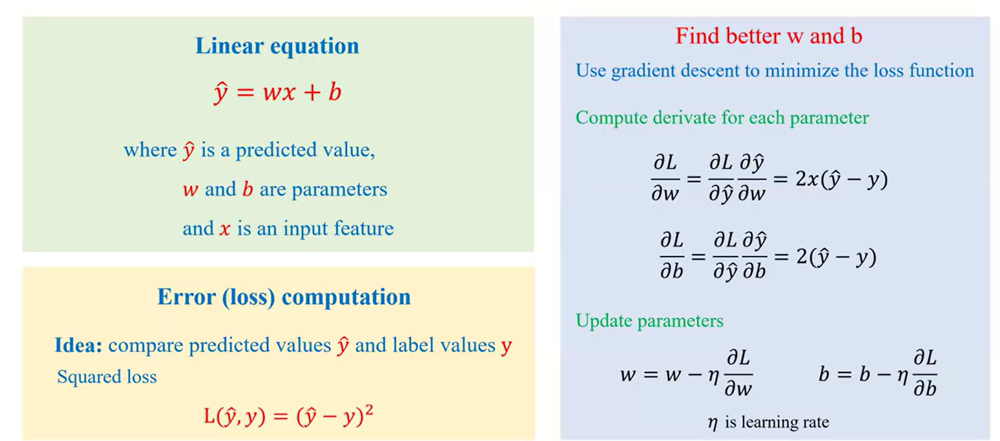

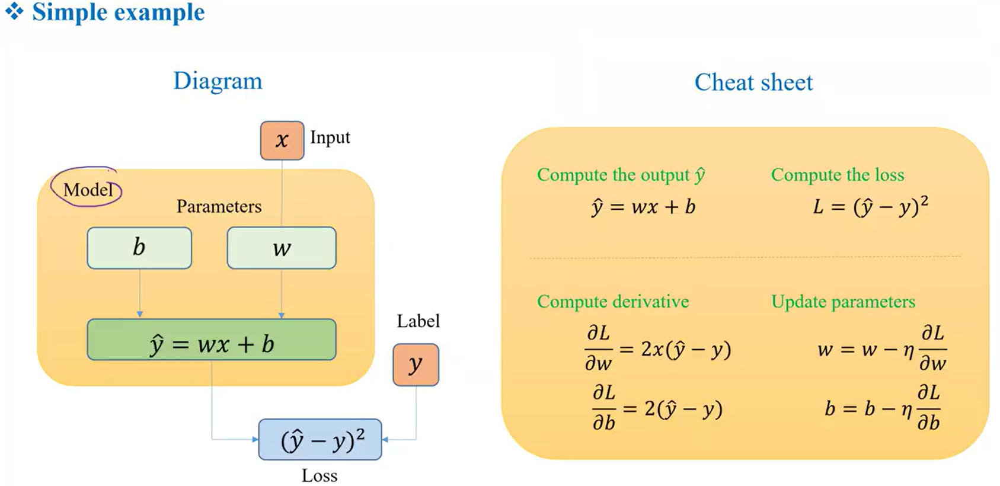

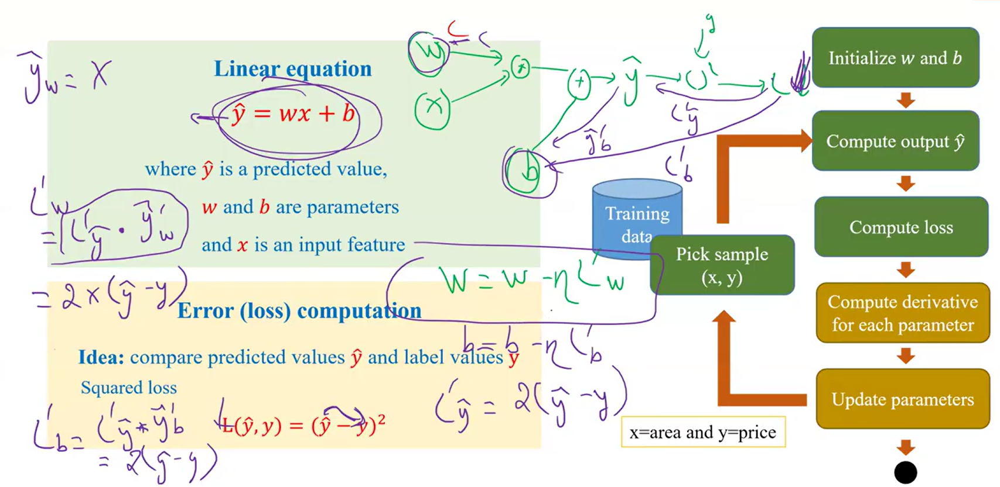

## Find loss function

### Step1:

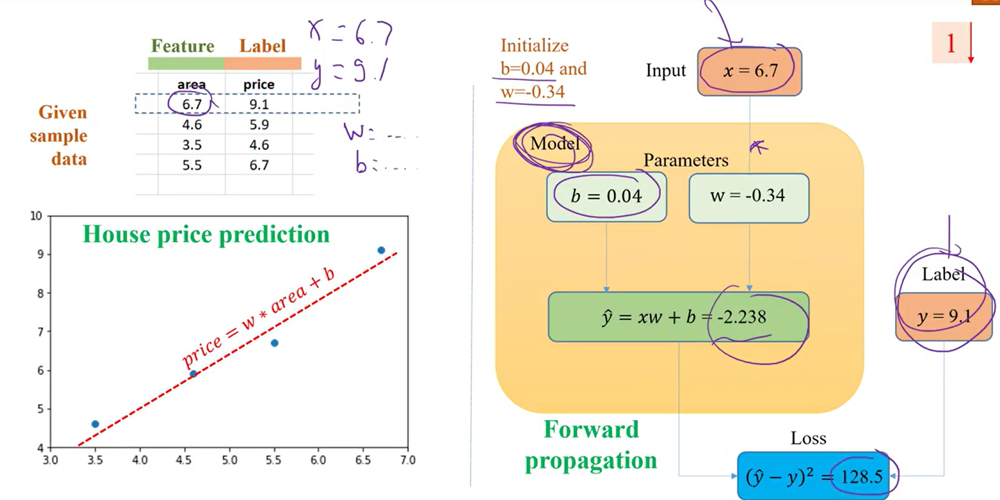

### Step2:  

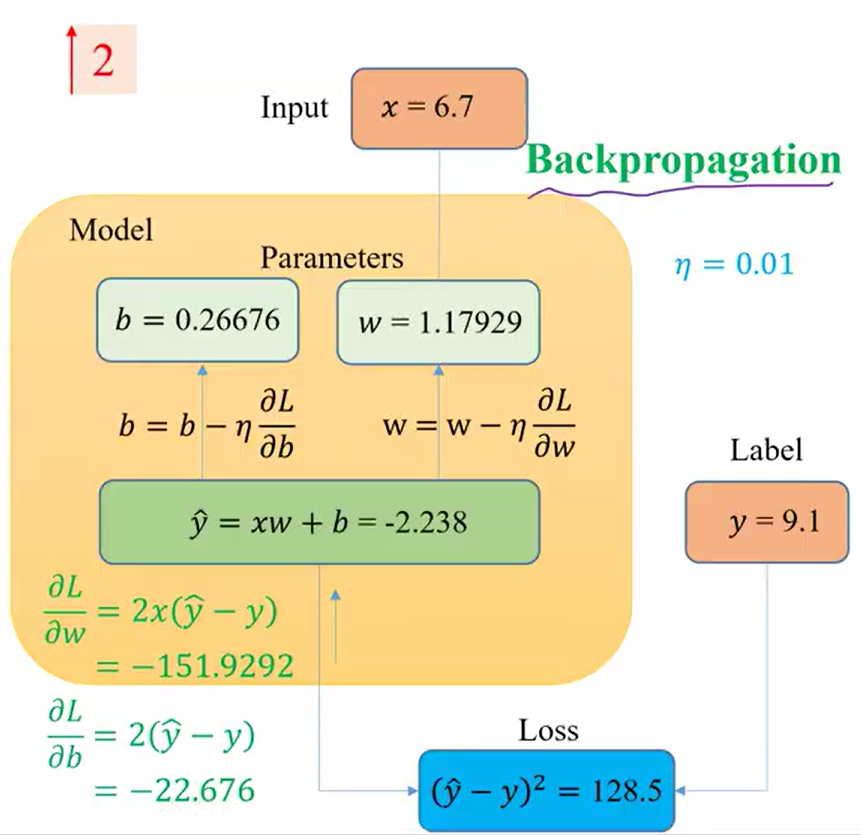

### Step3:

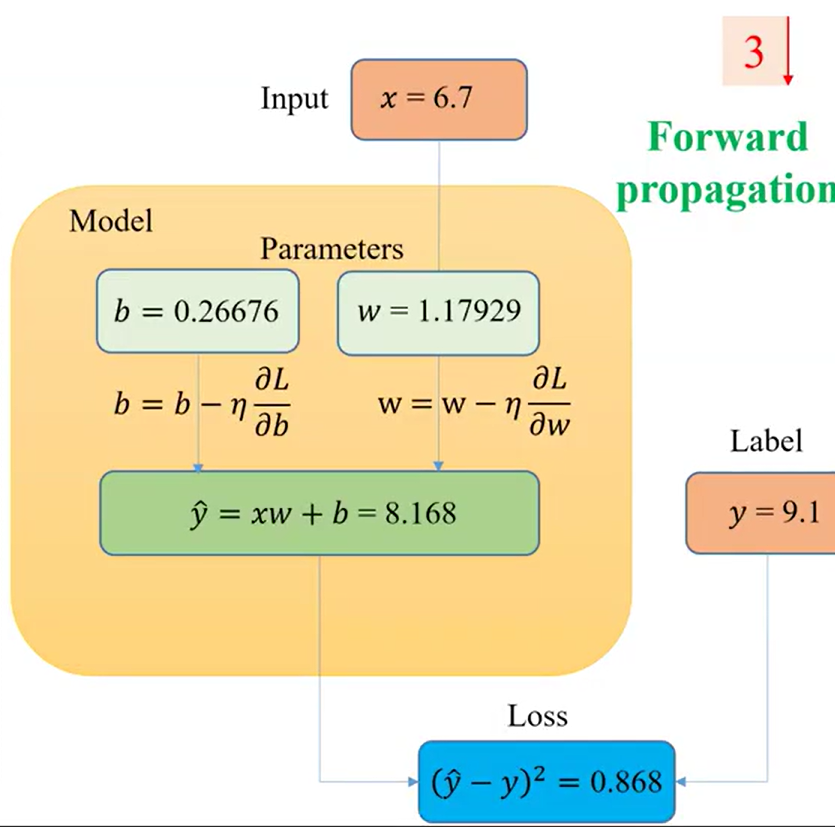

# Summary

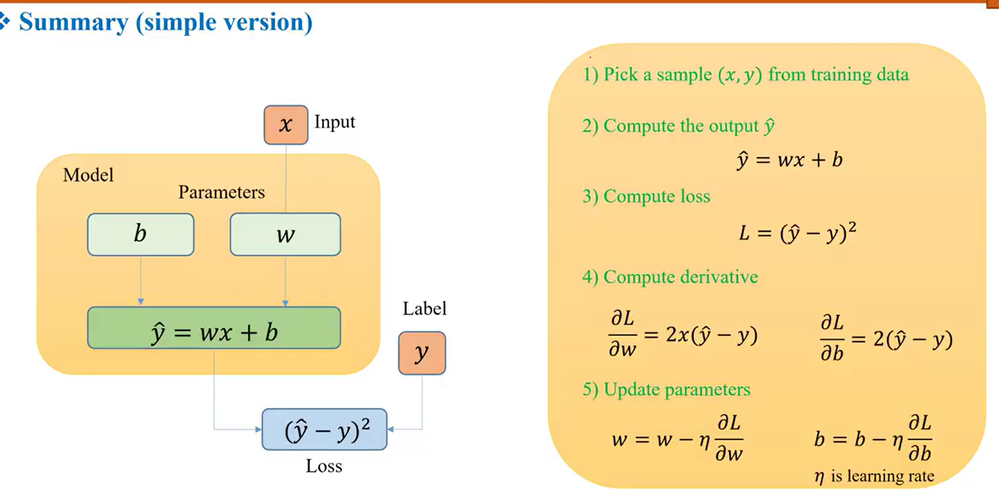

## Code

### import libraries


In [424]:
import matplotlib.pyplot as plt
import numpy as np

### Example data

In [425]:
area = np.array([6.7, 4.6, 3.5, 5.5])
prices = np.array([9.1, 5.9, 4.6, 6.7])
num_epochs = 10
N = len(area)
w= -0.34
b= 0.04
lr = 0.01

### Function prediction, loss function

In [426]:
def predict(x, w, b):
    return x*w + b

def compute_loss(y_hat, y):
    return (y_hat - y)**2

def compute_gradient(x, y_hat, y):
    dl_dw = 2*x*(y_hat - y)
    dl_db = 2*(y_hat - y)
    return dl_dw, dl_db

def update(w, b, dl_dw, dl_db, lr):
    w = w -lr*dl_dw
    b = b - lr*dl_db
    return w, b

In [427]:
#debug
losses = []
for _ in range(num_epochs):    
    # get sample
    for x,y in zip(area, prices):
        #predict
        y_hat = predict(x,w,b)
        #compute loss
        loss = compute_loss(y_hat, y)
        losses.append(loss)
        #compute gradient
        dl_dw, dl_db = compute_gradient(x, y_hat, y)
        #update
        w, b = update(w, b, dl_dw, dl_db, lr)

40


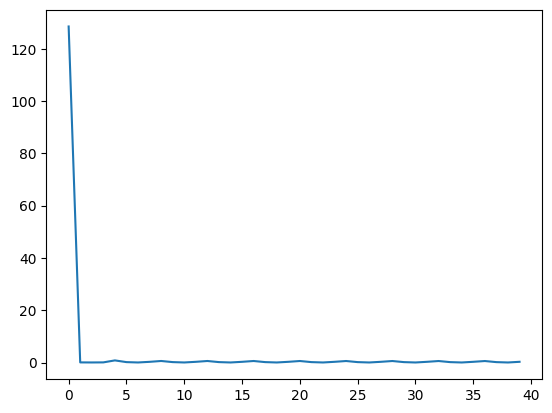

In [428]:
print(len(losses))
plt.plot(losses)

## Computation graph

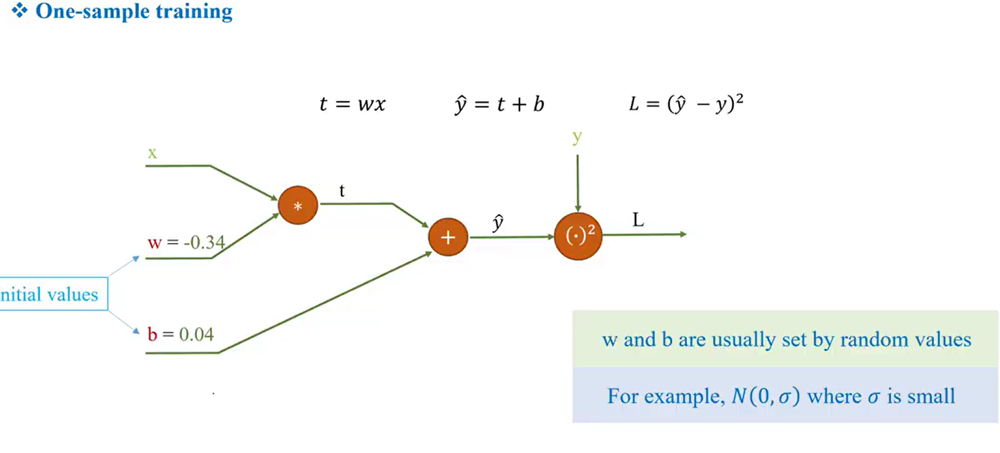

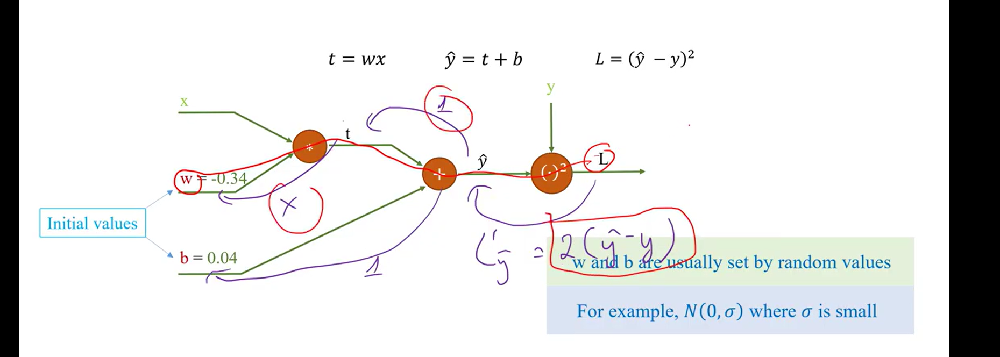

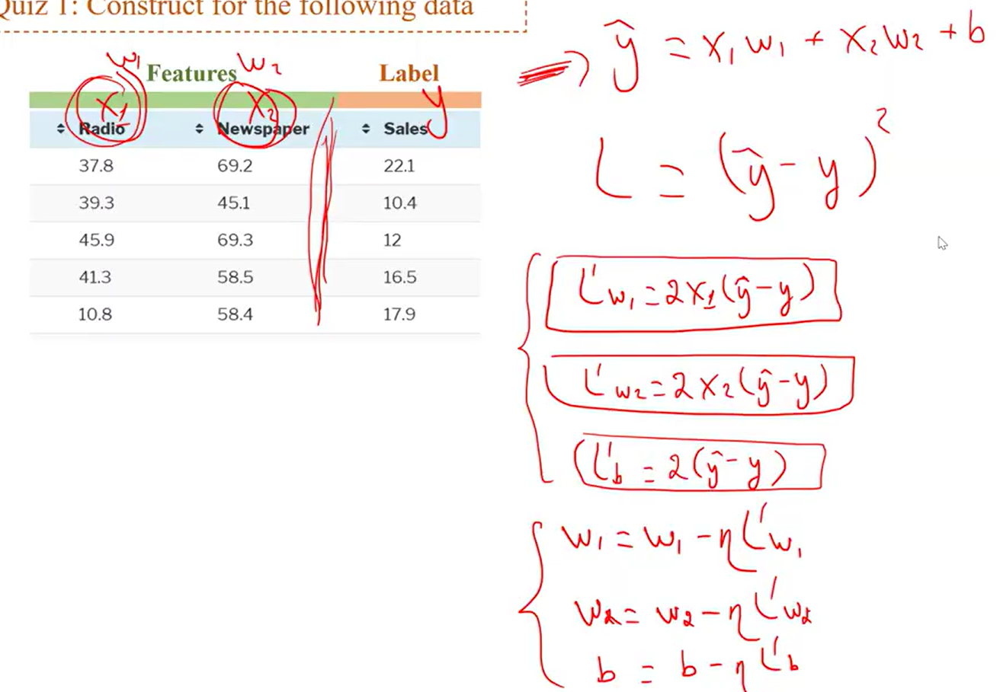

## Mini batch

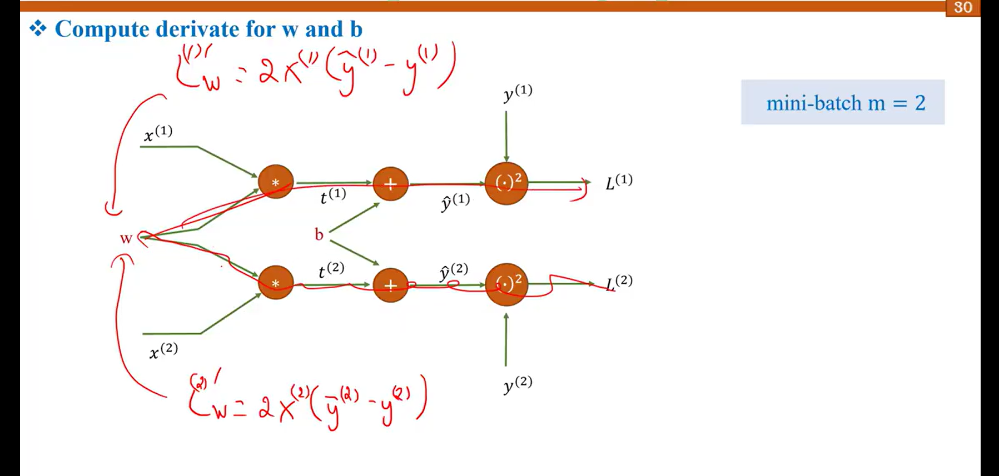

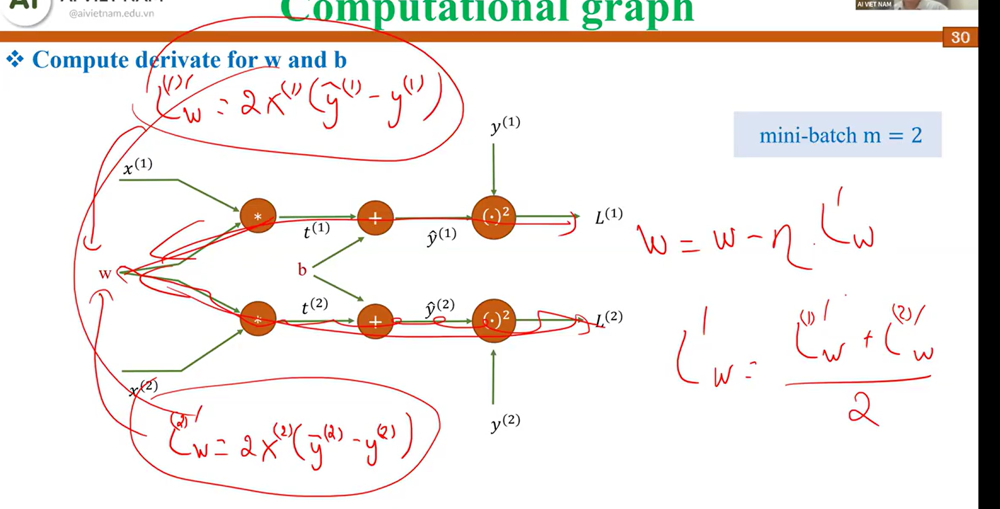

# Vectorized linear regression

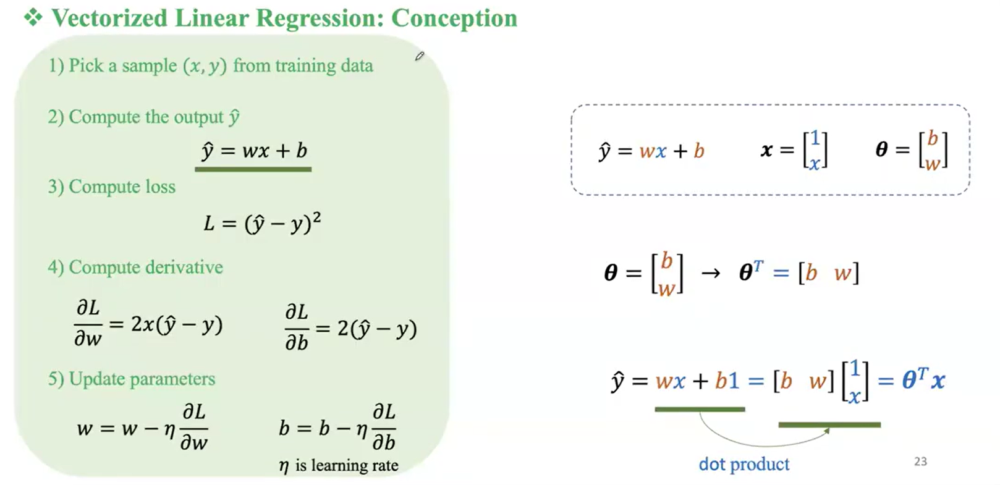

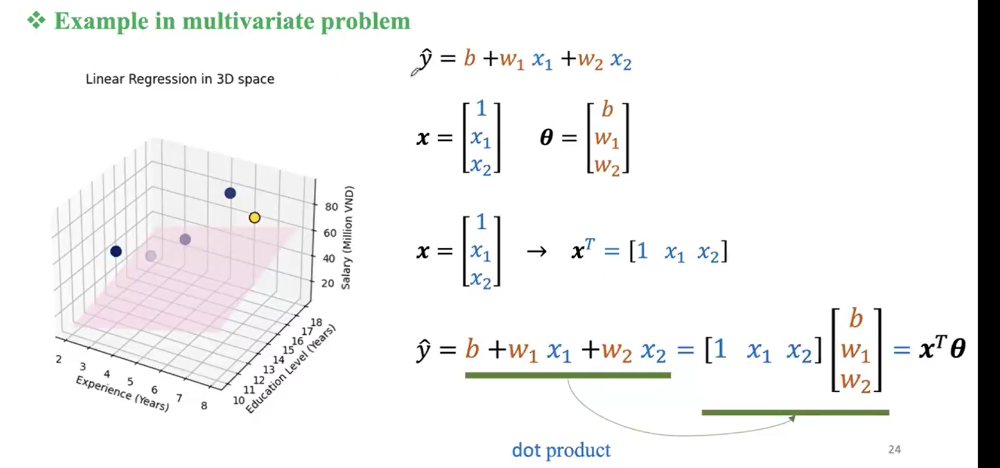

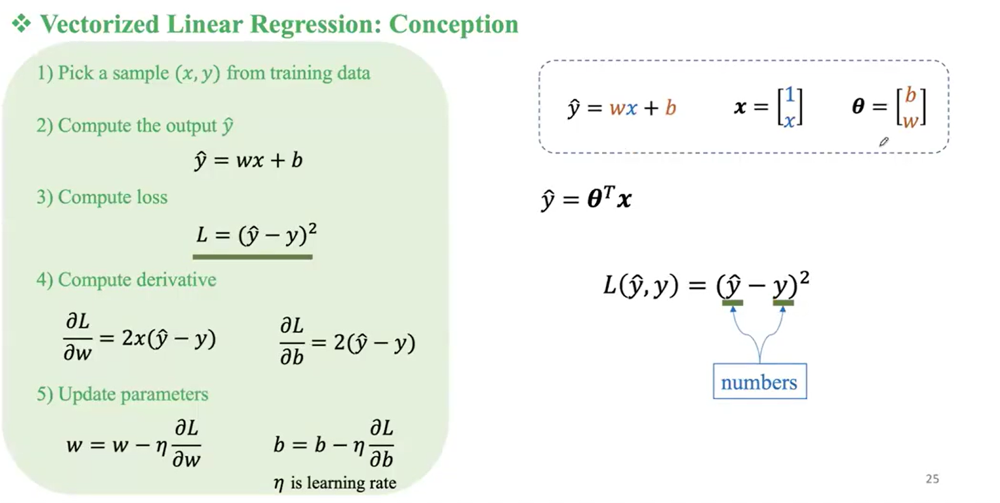

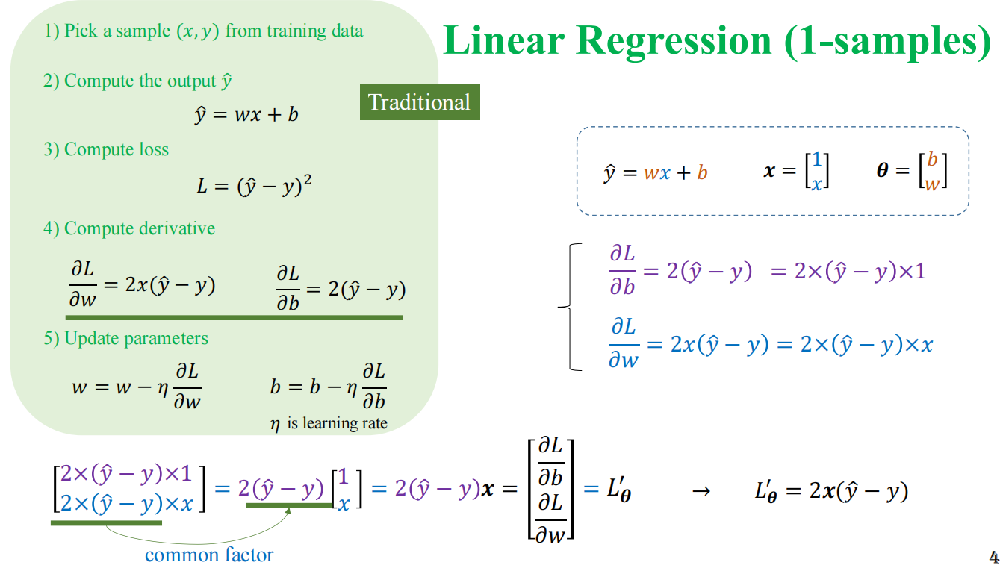

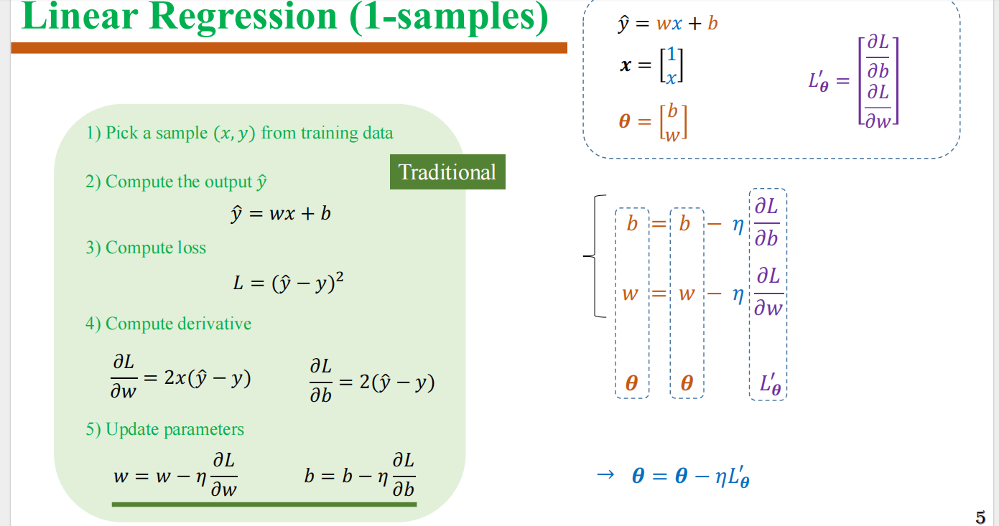

# Summary vectorized


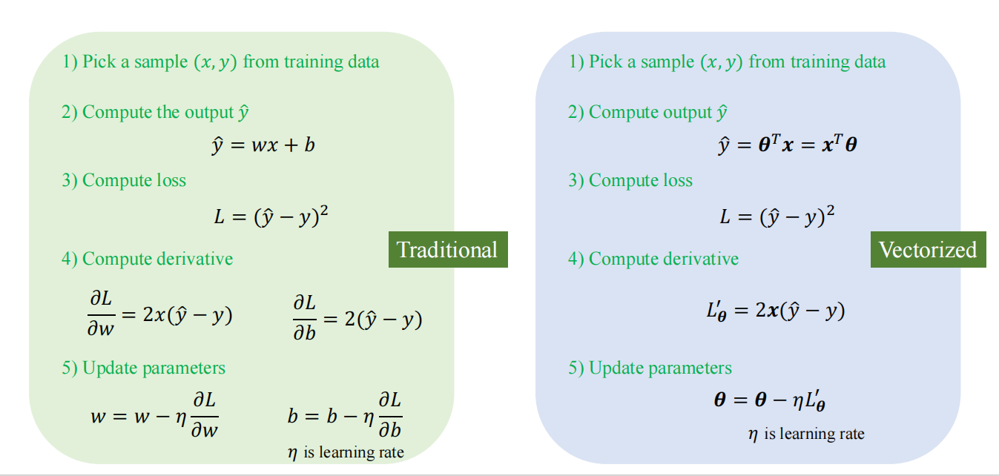

# N-sample vectorized linear regression

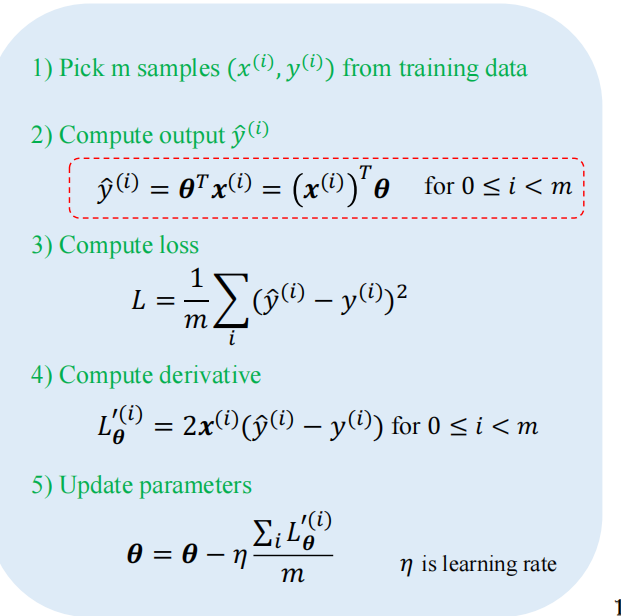

# Code implementation

## 1 Sample

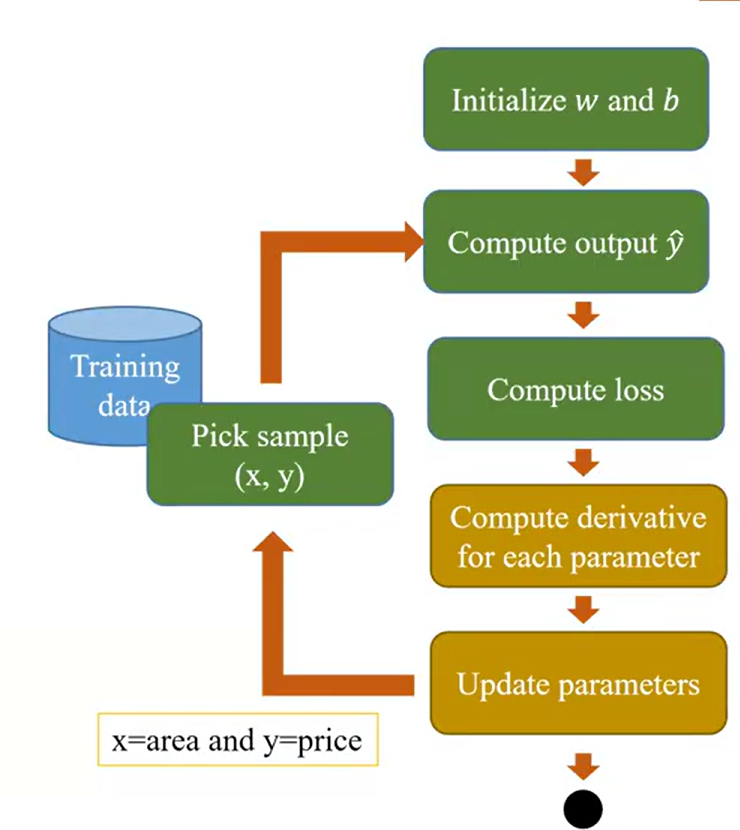
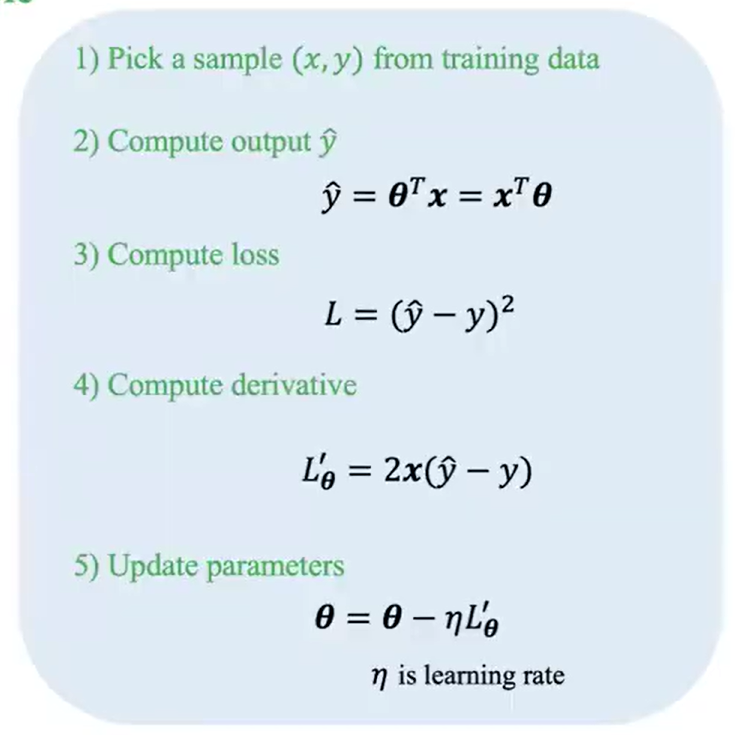

import libraries

```python

In [429]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import genfromtxt

read dataset, prepare data

In [430]:
N = 4
data = genfromtxt('data.csv', delimiter=',')
area = data[:,0].reshape(N,1)    # : chọn tất cả hàng, cột 0
print(area)
price = data[:, 1].reshape(N,)
print(price)

## vector [1, area]
featute = np.hstack([np.ones((N, 1)), area])    
print("feature: \n", featute)
print("prices: \n", price)

[[6.7]
 [4.6]
 [3.5]
 [5.5]]
[9.1 5.9 4.6 6.7]
feature: 
 [[1.  6.7]
 [1.  4.6]
 [1.  3.5]
 [1.  5.5]]
prices: 
 [9.1 5.9 4.6 6.7]


initialization w. b

In [431]:
theta = np.array([0.049, -0.34])
print("theta: \n", theta)

theta: 
 [ 0.049 -0.34 ]


function prediction, , compute gradient, updata weights

In [432]:
def predict(x,theta):
    return x.T.dot(theta)

def compute_gradient(y_hat, y, x):
    dtheta = 2*x*(y_hat - y)
    return dtheta

def update_weights(theta, lr, dtheta):
    dtheta_new = theta - lr*dtheta
    return dtheta_new

test

In [433]:
lr = 0.01
epoch_max = 10
losses = []

for epoch in range(epoch_max):
    for i in range(N):
        x = featute[i, :]
        y = price[i]

        #predict y_hat
        y_hat = predict(x, theta)

        #compute loss
        loss = (y_hat - y)**2
        losses.append(loss)

        #compute gradient
        dtheta = compute_gradient(y_hat, y, x)

        #update weights
        theta = update_weights(theta, lr, dtheta)

print(theta)

[0.2335058  1.21100306]


visualize 

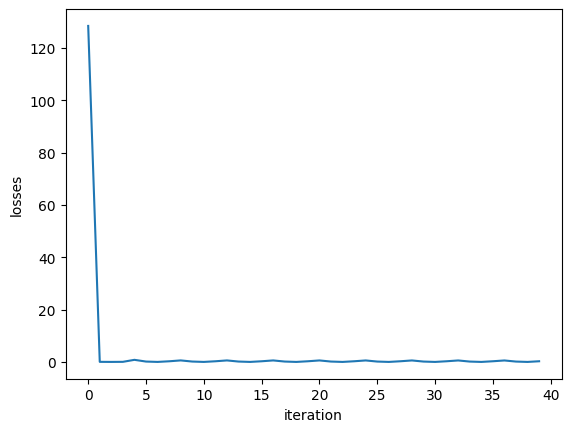

In [434]:
plt.plot(losses)
plt.xlabel("iteration")
plt.ylabel("losses")
plt.show()

## m sample 


import library

In [435]:
import numpy as np 
import matplotlib.pyplot as plt
from numpy import genfromtxt


read dataset

[[9.1]
 [5.9]
 [4.6]
 [6.7]]


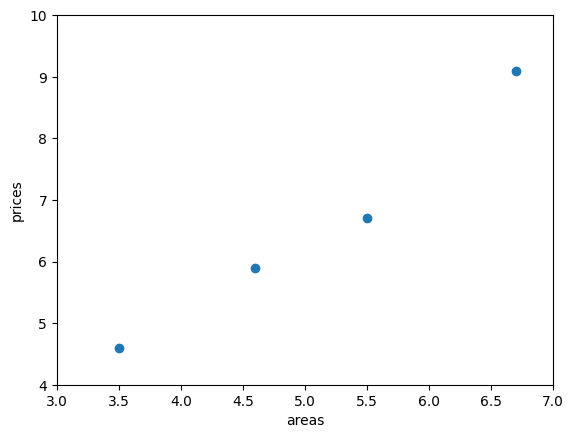

In [436]:
data = genfromtxt('data.csv', delimiter=',')
area = data [:, 0]
price = data[:, 1:]
print(price)
plt.scatter(area, price)
plt.xlabel('areas')
plt.ylabel('prices')
plt.xlim(3,7)
plt.ylim(4,10)
plt.show()


In [437]:
#vector[x,b].T

data = np.vstack([area, np.ones((N,))])
print('data: \n', data)

theta = np.array([[-0.34], [0.04]])
print('theta: \n', theta)
print(theta.shape)

data: 
 [[6.7 4.6 3.5 5.5]
 [1.  1.  1.  1. ]]
theta: 
 [[-0.34]
 [ 0.04]]
(2, 1)


In [438]:

epoch_max = 20
m = 2
lr = 0.01
losses = []

In [439]:
for epoch in range(epoch_max):
    for i in range(0, N, m):
        # get m samples
        x = data[:, i:i+m]
        y = price[i:i+m, :]
        #predict y_hat
        y_hat = theta.T.dot(x)
        #compute loss
        loss = (1/m)*(y_hat-y.T).dot((y_hat - y.T).T)
        losses.append(loss[0][0])

        # compute gradient
        k = 2*(y_hat - y.T)
        gradients = np.multiply(np.vstack((k, k)), x)
        gradients = gradients.dot(np.ones((m,1))) / m
        #update weights
        theta = theta - lr*gradients
    print(theta)

[[0.94667545]
 [0.2675641 ]]
[[1.17607894]
 [0.30663018]]
[[1.21721045]
 [0.31213298]]
[[1.22481526]
 [0.31166216]]
[[1.22644927]
 [0.31013067]]
[[1.22701945]
 [0.30841337]]
[[1.2273996 ]
 [0.30666605]]
[[1.22774533]
 [0.30491644]]
[[1.22808433]
 [0.30316948]]
[[1.22842154]
 [0.30142602]]
[[1.22875786]
 [0.29968623]]
[[1.22909342]
 [0.29795013]]
[[1.22942827]
 [0.2962177 ]]
[[1.22976241]
 [0.29448895]]
[[1.23009583]
 [0.29276386]]
[[1.23042855]
 [0.29104243]]
[[1.23076057]
 [0.28932464]]
[[1.23109188]
 [0.28761051]]
[[1.23142249]
 [0.2859    ]]
[[1.2317524 ]
 [0.28419312]]


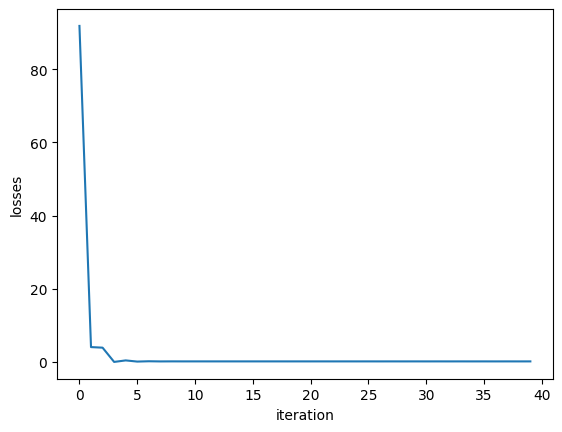

In [440]:
import matplotlib.pyplot as plt
plt.plot(losses)
plt.xlabel('iteration')
plt.ylabel('losses')
plt.show()

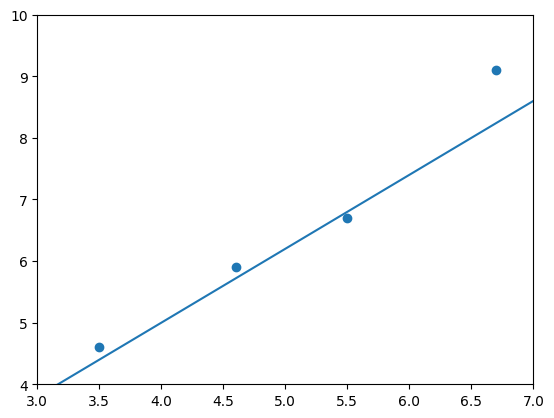

In [441]:
# test
predict_w = 1.2
predict_b = 0.2

x_data = range(2,8)
y_data = [x*predict_w +predict_b for x in x_data]

plt.plot(x_data, y_data)

plt.scatter(area, price)
plt.xlim(3,7)
plt.ylim(4,10)
plt.show()

## summary m-sample


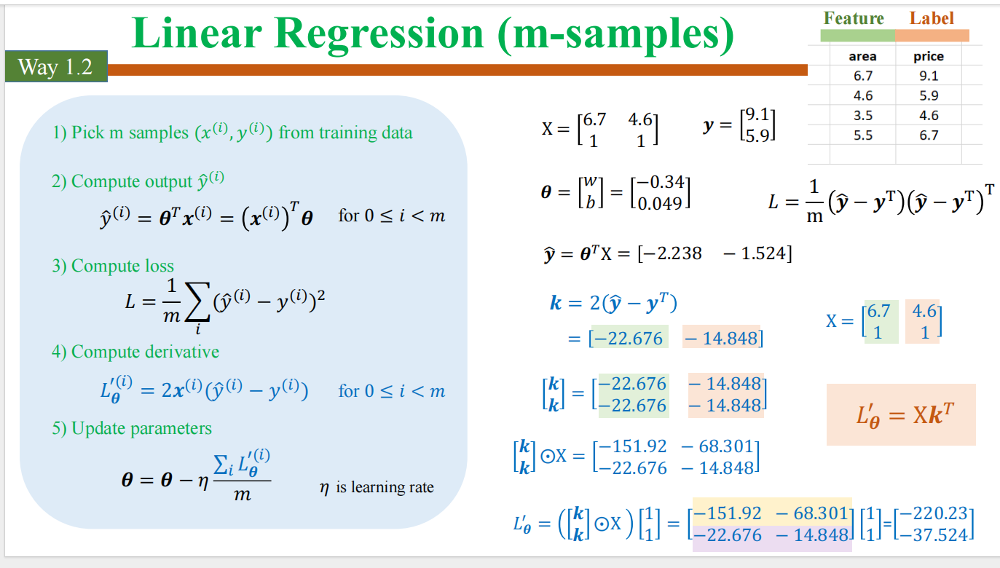

# N-sample

In [442]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import genfromtxt

data = np.genfromtxt('data.csv', delimiter=',')

area = data[:,[0]]
price = data[:,1]
N = area.size

#vector [x, b]
data = np.hstack([area, np.ones((N, 1))])


# [w,b]
theta = np.array([[-0.34], 
                  [0.049]])

print(data)
print(theta)
print(prices)

[[6.7 1. ]
 [4.6 1. ]
 [3.5 1. ]
 [5.5 1. ]]
[[-0.34 ]
 [ 0.049]]
[9.1 5.9 4.6 6.7]


In [443]:
#params
lr =0.01
epoch_max = 20

losses = []

for epoch in range(epoch_max):

    # get all the sample
    x = data
    y = price

    # predict y_hat
    y_hat = x.dot(theta)
    # compute loss
    loss = np.multiply((y_hat - y), (y_hat - y))
    losses.append(np.mean(loss))
    # compute gradient
    k = 2*(y_hat - y)
    gradient = k.T.dot(x) / N
    #update weights
    theta = theta - lr*gradient.T

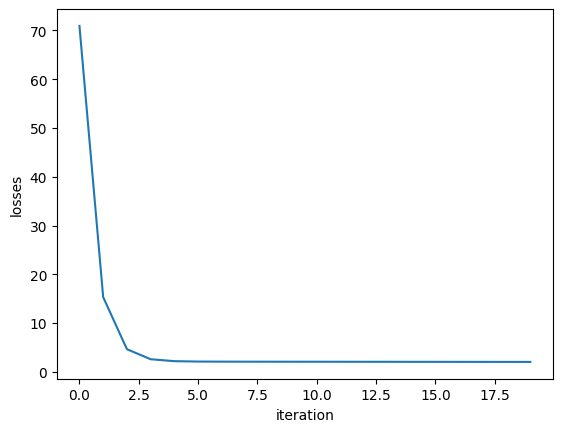

In [444]:
plt.plot(losses)
plt.xlabel('iteration')
plt.ylabel('losses')
plt.show()